# Generate data from rate model

In [1]:
import os, scipy.io 
import numpy as np 
# %matplotlib ipympl
import matplotlib.pyplot as plt 
from mpl_toolkits.mplot3d import axes3d
import importlib

import sys

sys.path.append('/home/nuttidalab/Documents/renee/spikeRNN/analysis/utils')
import load_data as ld
import lfp_utils as lu

import pickle as pk

2025-10-15 17:38:23.038156: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-10-15 17:38:23.046735: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-10-15 17:38:23.055830: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-10-15 17:38:23.058555: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-10-15 17:38:23.066147: I tensorflow/core/platform/cpu_feature_guar

### get trained models

In [2]:
# jitter models trained without LFP input

xlfp_model_dir = '/home/nuttidalab/Documents/renee/jitter_models/models/xor/P_rec_0.2_Taus_4.0_25.0'

xlfp_model_list = ld.find_files_keywords(xlfp_model_dir, ['Jitter_10_10', '.mat'])
# remove directories 
xlfp_model_list = [m.split('/')[-1] for m in xlfp_model_list]
xlfp_model_list.sort()

print(xlfp_model_list)
print(len(xlfp_model_list))

['Task_xor_N_200_Jitter_10_10_2025_10_09_160044.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_160147.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_160548.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_161657.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_163726.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_163742.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_163812.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_165102.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_165551.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_170029.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_171137.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_171612.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_175257.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_200153.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_200416.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_201332.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_202707.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_202718.mat', 'Task_xor_N_200_Jitter_10_10_2025_10_09_20313

In [3]:
# jitter models trained with LFP input

lfp_model_dir = '/home/nuttidalab/Documents/renee/lfp_input_models_wtrain/models/xor/phase/P_rec_0.2_Taus_4.0_25.0'

lfp_model_list = ld.find_files_keywords(lfp_model_dir, ['Jitter_10_10', '4.0', '.mat'])
# remove directories
lfp_model_list = [m.split('/')[-1] for m in lfp_model_list]
lfp_model_list.sort()

print(lfp_model_list)
print(len(lfp_model_list))


['Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_134255.mat', 'Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_134527.mat', 'Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_134559.mat', 'Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_134903.mat', 'Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_135100.mat', 'Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_135226.mat', 'Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_135856.mat', 'Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_140038.mat', 'Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_140105.mat', 'Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_140736.mat', 'Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_141248.mat', 'Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_141842.mat', 'Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_26_121450.mat', 'Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_26_121653.mat', 'Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_26_121726.mat', 'Task_xor

In [4]:
# delay400
settings = {
        'T': 650, # trial duration (in steps)
        'stim_on': 50, # input stim onset (in steps)
        'stim_dur': 50, # input stim duration (in steps)
        'delay': 400, # delay b/w the two stimuli (in steps)
        'DeltaT': 1, # sampling rate
        'taus': 20, # decay time-constants (in steps)
        'lfp_power_target': [4], # theta
        'power_target_period': 'delay',
        'fs': 200,
        'task': 'xor', # task name
        }

Processing model type: xlfp, number of models: 25
Processing model type: lfp, number of models: 31


/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/home/nuttidalab/miniconda3/envs/rnn_test/lib

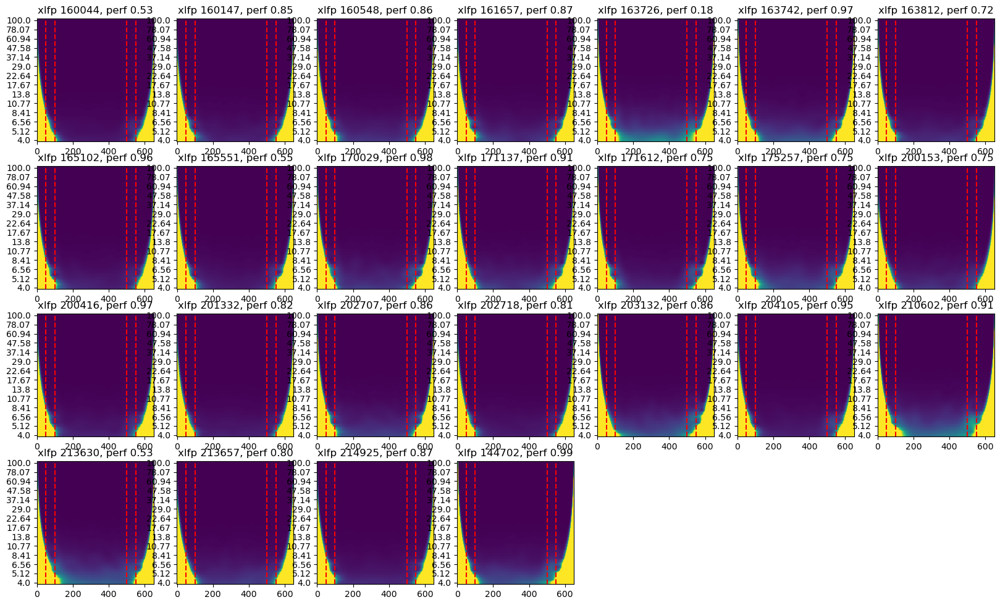

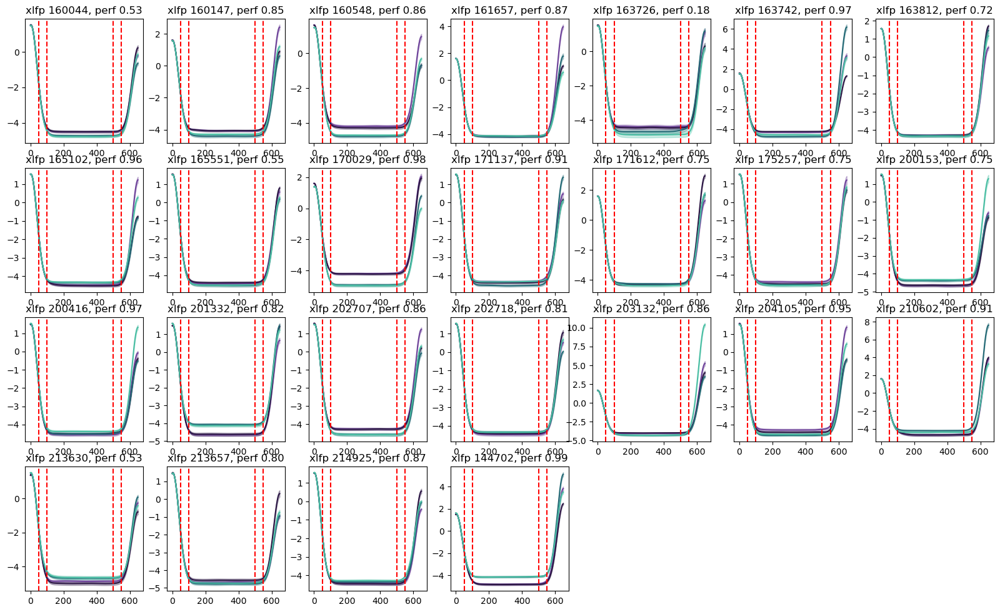

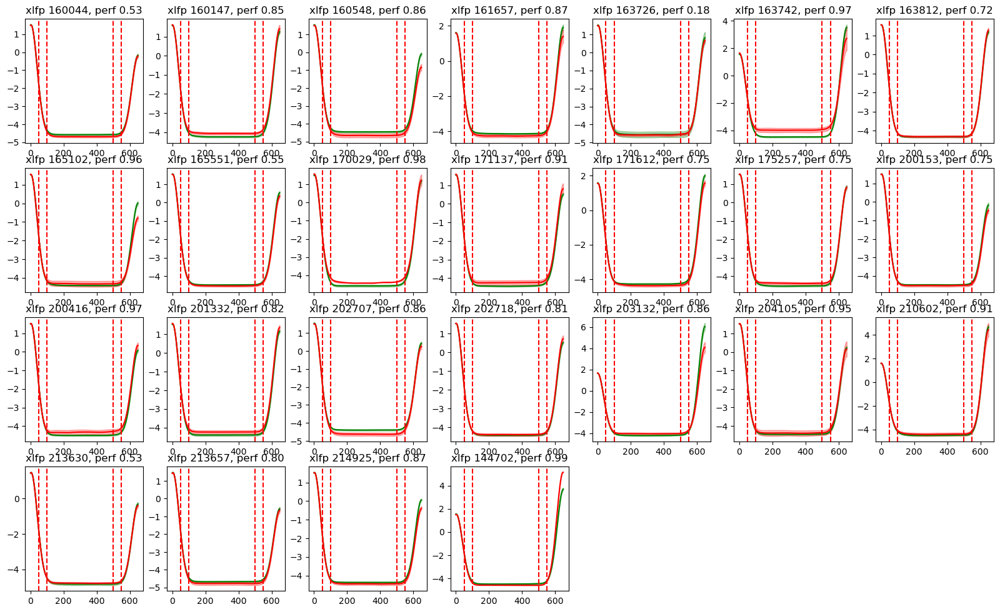

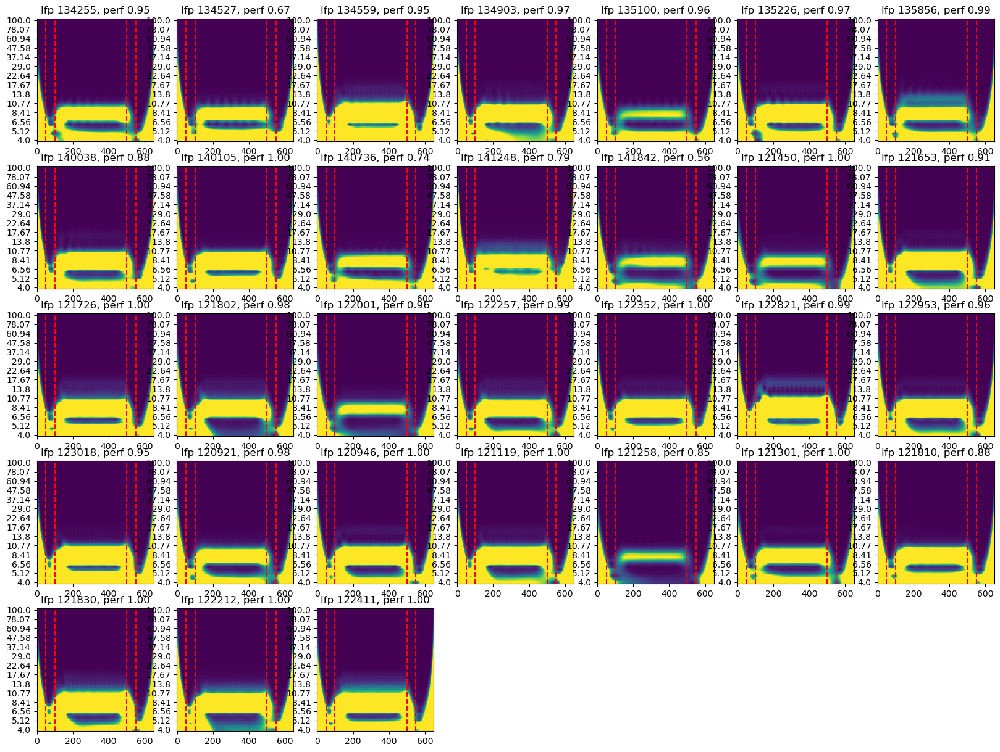

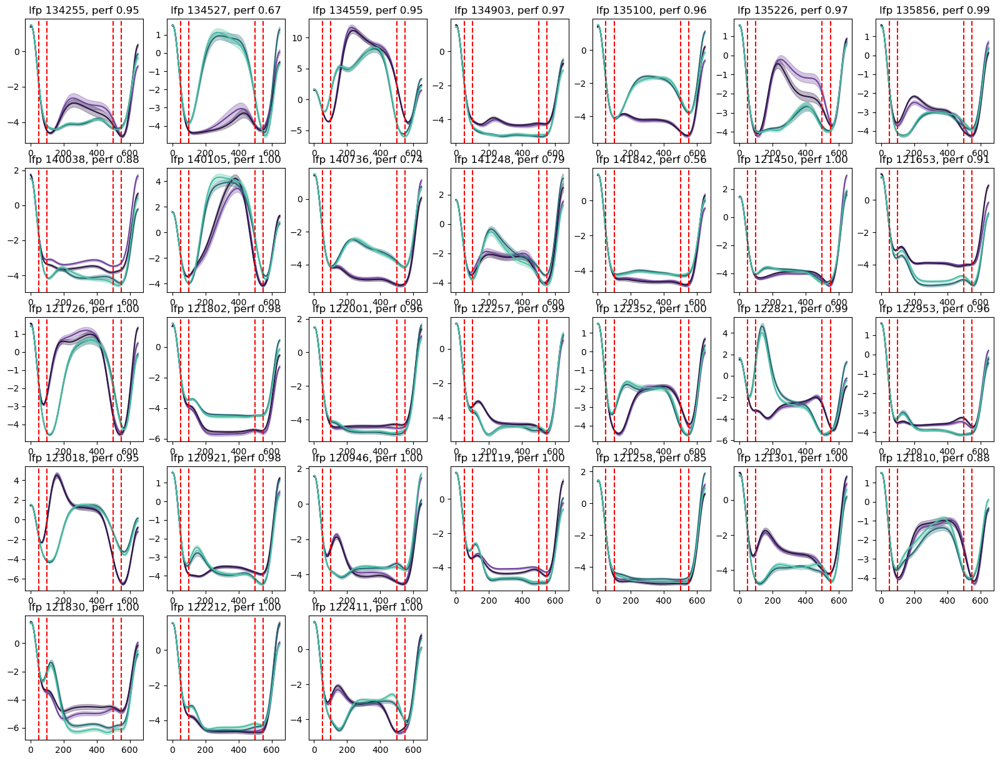

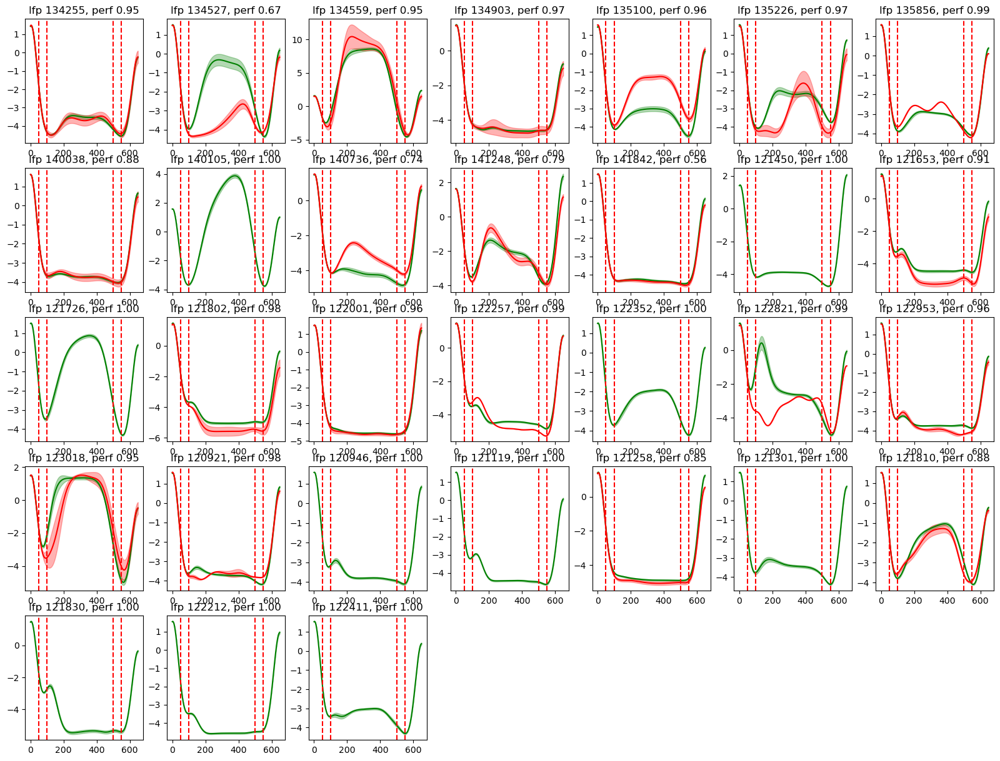

In [20]:
# make plots: spect, bandpower by trial type, bandpower by correct/incorrect -- z-scoring at bandpower step

importlib.reload(lu)

model_lists = [xlfp_model_list, lfp_model_list] #, lfp_alpha_model_list]
model_dirs = [xlfp_model_dir, lfp_model_dir] #, lfp_model_dir]
model_list_names = ['xlfp', 'lfp'] #, 'lfp_alpha']
model_powers = [4, 4]
condn = 'delay400'

for model_list, model_dir, model_list_name, model_power in zip(model_lists, model_dirs, model_list_names, model_powers):
    settings['lfp_power_target'] = [model_power]

    print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')
    
    # create figure
    fig1 = plt.figure(figsize=(20, 15)) # spectrogram
    fig2 = plt.figure(figsize=(20, 15)) # band power, split by trial type
    fig3 = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

    for model_name in model_list:
        # print(f"\nModel: {model_name}")
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn}.pkl'), 'rb'))
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]
        
        trial_power, freqs, phase = lu.compute_lfp_power(neural_dict['epsp'], settings['fs'], freq_range = [4, 100], num_freqs = n_freqs, n_cycles=7)
        trial_powerband = lu.compute_bandpower(trial_power, freqs, settings, band=[model_power], zscore=True, baseline=[10, 50])

        # first plot spectrogram
        ax1 = fig1.add_subplot(5, 7, model_list.index(model_name)+1)
        ax1.imshow(np.mean(trial_power, axis=0), aspect='auto', origin='lower',
               vmin=0, vmax=1.2)
        ax1.set_yticks(np.arange(0, 40, 3), np.round(freqs[::3], 2))
        # ax1.colorbar(label='Power')
        ax1.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax1.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
        
        # then plot band power, split by trial type
        ax2 = fig2.add_subplot(5,7, model_list.index(model_name)+1)
        stims, colors = ld.get_trialtype_colors()
        trial_types, trial_idxs = np.unique(np.array(bhv_dict['trial_type']), axis=0, return_inverse=True)
        for i, trial_type in enumerate(trial_types):
            trials_idx = (trial_idxs == i)
            powerband_mean = np.mean(trial_powerband[trials_idx, :], axis=0)
            powerband_sem = np.std(trial_powerband[trials_idx, :], axis=0) / np.sqrt(np.sum(trials_idx))
            ax2.plot(powerband_mean, color=colors[i])#, label=stims[i])
            ax2.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color=colors[i], alpha=0.3)
        ax2.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax2.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
        
        # finally plot band power, split by correct/incorrect
        ax3 = fig3.add_subplot(5, 7, model_list.index(model_name)+1)
        correct_trials = (np.array(bhv_dict['perf']) == 1)
        incorrect_trials = (np.array(bhv_dict['perf']) == 0)
        powerband_mean = np.mean(trial_powerband[correct_trials, :], axis=0)
        powerband_sem = np.std(trial_powerband[correct_trials, :], axis=0) / np.sqrt(np.sum(correct_trials))
        ax3.plot(powerband_mean, color='g', label='correct')
        ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='g', alpha=0.3)
        powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
        powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
        ax3.plot(powerband_mean, color='r', label='incorrect')
        ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='r', alpha=0.3)
        ax3.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax3.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')



Processing model type: xlfp, number of models: 25
Processing model type: lfp, number of models: 31


/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/home/nuttidalab/miniconda3/envs/rnn_test/lib

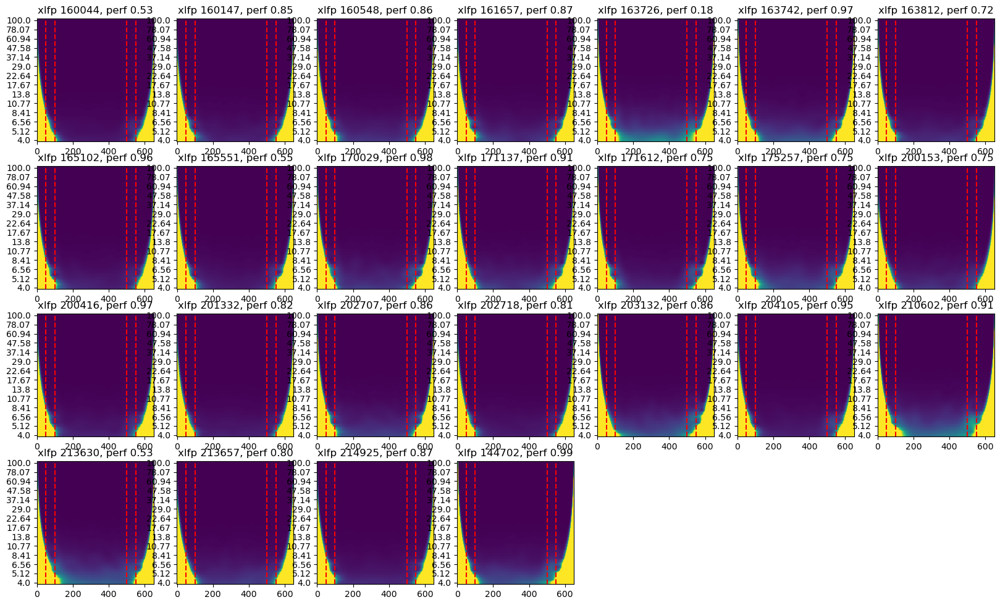

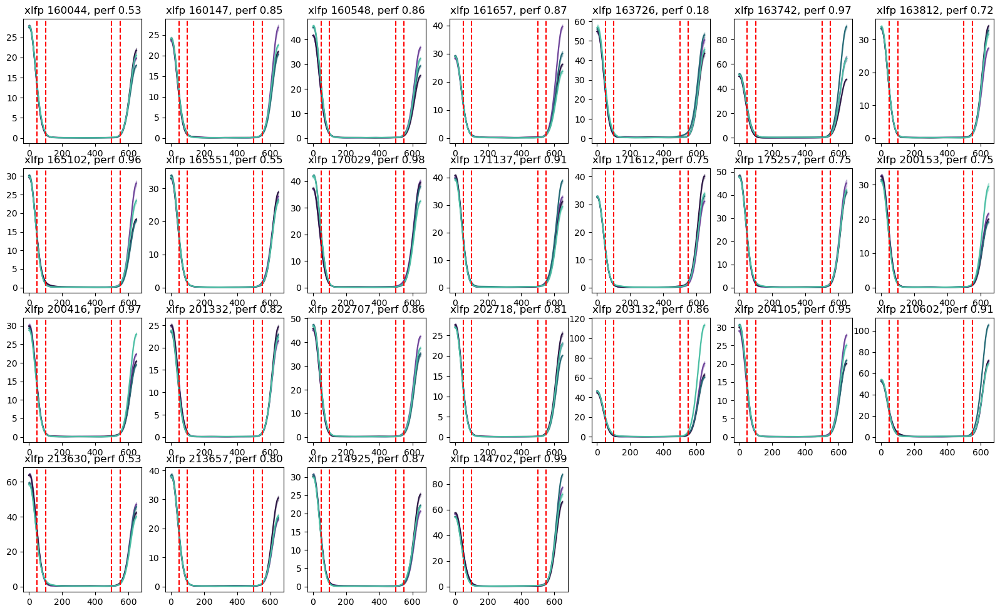

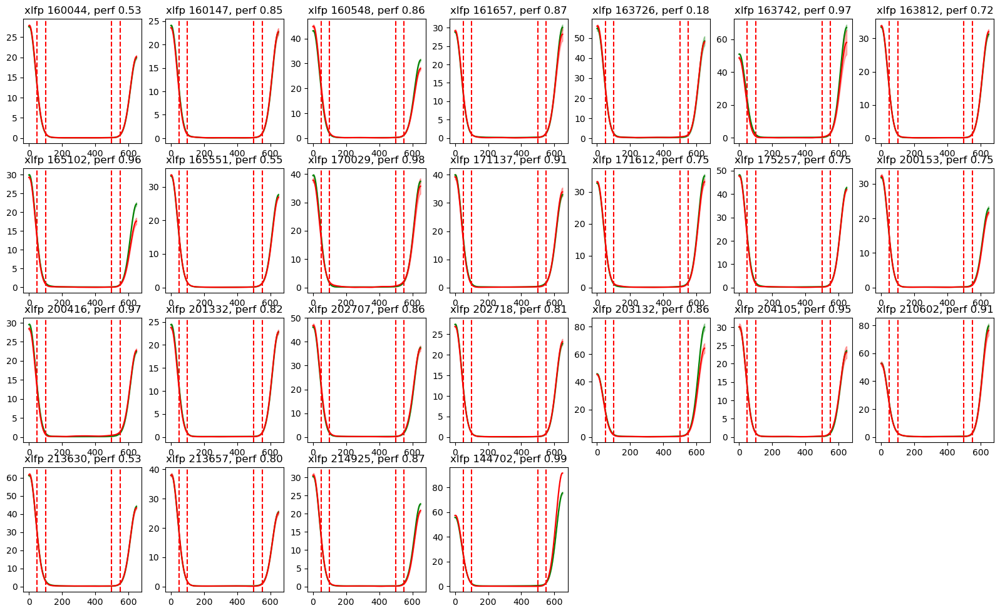

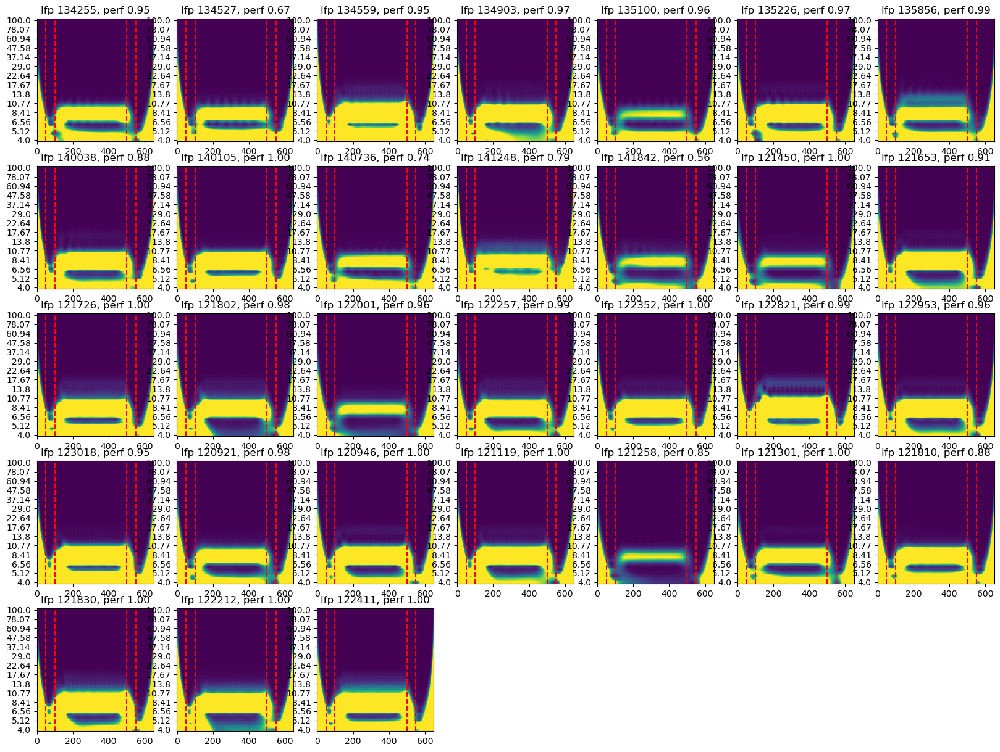

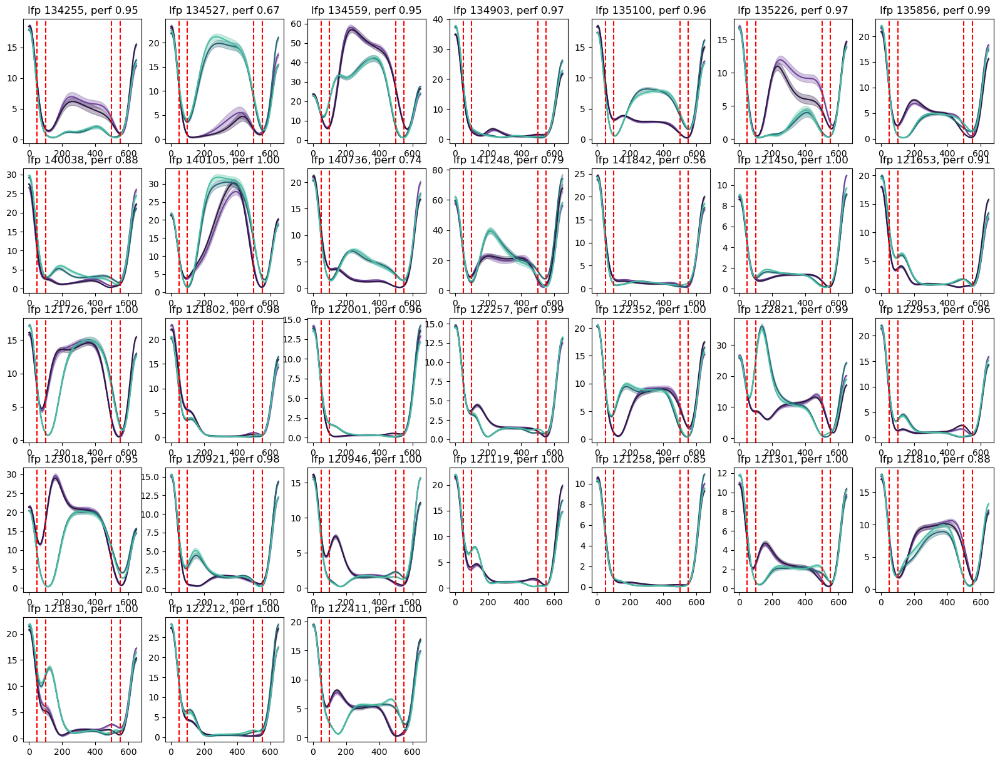

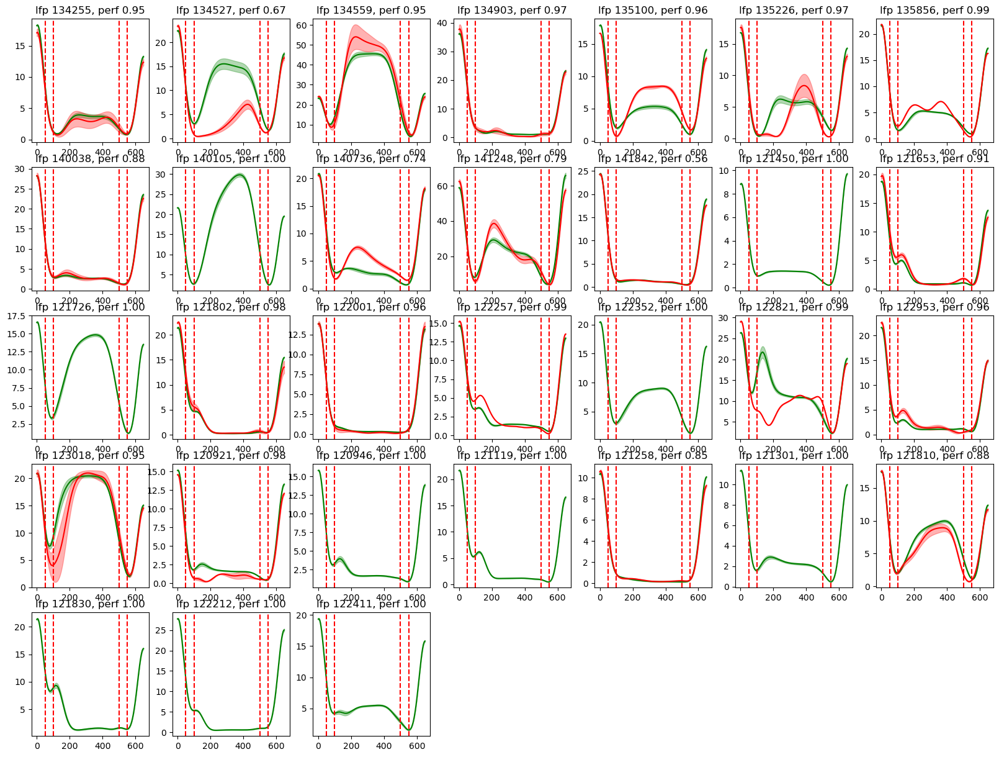

In [21]:
# make plots: spect, bandpower by trial type, bandpower by correct/incorrect -- taking out z-score

importlib.reload(lu)

model_lists = [xlfp_model_list, lfp_model_list] #, lfp_alpha_model_list]
model_dirs = [xlfp_model_dir, lfp_model_dir] #, lfp_model_dir]
model_list_names = ['xlfp', 'lfp'] #, 'lfp_alpha']
model_powers = [4, 4]
condn = 'delay400'

for model_list, model_dir, model_list_name, model_power in zip(model_lists, model_dirs, model_list_names, model_powers):
    settings['lfp_power_target'] = [model_power]

    print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')
    
    # create figure
    fig1 = plt.figure(figsize=(20, 15)) # spectrogram
    fig2 = plt.figure(figsize=(20, 15)) # band power, split by trial type
    fig3 = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

    for model_name in model_list:
        # print(f"\nModel: {model_name}")
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn}.pkl'), 'rb'))
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]
        
        trial_power, freqs, phase = lu.compute_lfp_power(neural_dict['epsp'], settings['fs'], freq_range = [4, 100], num_freqs = n_freqs, n_cycles=7)
        trial_powerband = lu.compute_bandpower(trial_power, freqs, settings, band=[model_power], zscore=False, baseline=[10, 50])

        # first plot spectrogram
        ax1 = fig1.add_subplot(5, 7, model_list.index(model_name)+1)
        ax1.imshow(np.mean(trial_power, axis=0), aspect='auto', origin='lower',
               vmin=0, vmax=1.2)
        ax1.set_yticks(np.arange(0, 40, 3), np.round(freqs[::3], 2))
        # ax1.colorbar(label='Power')
        ax1.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax1.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
        
        # then plot band power, split by trial type
        ax2 = fig2.add_subplot(5,7, model_list.index(model_name)+1)
        stims, colors = ld.get_trialtype_colors()
        trial_types, trial_idxs = np.unique(np.array(bhv_dict['trial_type']), axis=0, return_inverse=True)
        for i, trial_type in enumerate(trial_types):
            trials_idx = (trial_idxs == i)
            powerband_mean = np.mean(trial_powerband[trials_idx, :], axis=0)
            powerband_sem = np.std(trial_powerband[trials_idx, :], axis=0) / np.sqrt(np.sum(trials_idx))
            ax2.plot(powerband_mean, color=colors[i])#, label=stims[i])
            ax2.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color=colors[i], alpha=0.3)
        ax2.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax2.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
        
        # finally plot band power, split by correct/incorrect
        ax3 = fig3.add_subplot(5, 7, model_list.index(model_name)+1)
        correct_trials = (np.array(bhv_dict['perf']) == 1)
        incorrect_trials = (np.array(bhv_dict['perf']) == 0)
        powerband_mean = np.mean(trial_powerband[correct_trials, :], axis=0)
        powerband_sem = np.std(trial_powerband[correct_trials, :], axis=0) / np.sqrt(np.sum(correct_trials))
        ax3.plot(powerband_mean, color='g', label='correct')
        ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='g', alpha=0.3)
        powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
        powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
        ax3.plot(powerband_mean, color='r', label='incorrect')
        ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='r', alpha=0.3)
        ax3.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax3.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')



In [5]:
# get avg bandpower during delay

importlib.reload(lu)

model_lists = [xlfp_model_list, lfp_model_list] #, lfp_alpha_model_list]
model_dirs = [xlfp_model_dir, lfp_model_dir] #, lfp_model_dir]
model_list_names = ['xlfp', 'lfp'] #, 'lfp_alpha']
model_powers = [4, 4]
condn = 'delay400'

delay_bandpower = { 'xlfp': [], 'lfp': [] }

for model_list, model_dir, model_list_name, model_power in zip(model_lists, model_dirs, model_list_names, model_powers):
    settings['lfp_power_target'] = [model_power]

    print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

    for model_name in model_list:
        # print(f"\nModel: {model_name}")
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn}.pkl'), 'rb'))
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]
        
        trial_power, freqs, phase = lu.compute_lfp_power(neural_dict['epsp'], settings['fs'], freq_range = [4, 100], num_freqs = n_freqs, n_cycles=7)
        trial_powerband = lu.compute_bandpower(trial_power, freqs, settings, band=[model_power], zscore=False, baseline=[10, 50])

        delay_idx = np.arange(settings['stim_on']+settings['stim_dur'], settings['stim_on']+settings['stim_dur']+settings['delay'])
        avg_delay_power = np.mean(trial_powerband[:, delay_idx], axis=1)
        delay_bandpower[model_list_name].append(avg_delay_power)
    delay_bandpower[model_list_name] = np.array(delay_bandpower[model_list_name])
    print(f'{model_list_name} avg delay bandpower shape: {delay_bandpower[model_list_name].shape}')
        

Processing model type: xlfp, number of models: 25
xlfp avg delay bandpower shape: (25, 100)
Processing model type: lfp, number of models: 31
lfp avg delay bandpower shape: (31, 100)


Mann-Whitney U test: stat=12.000, p=0.000


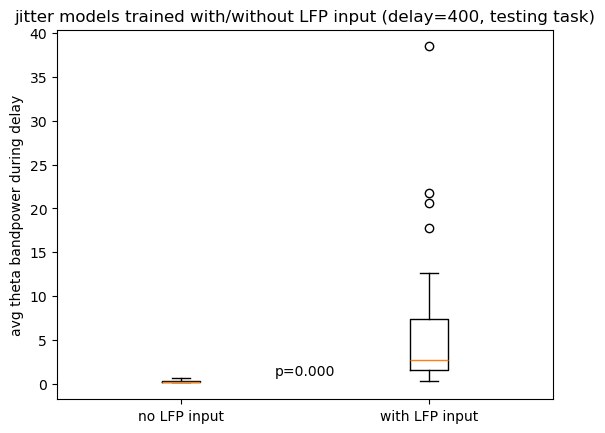

In [7]:
plt.figure()
plt.boxplot([np.mean(delay_bandpower['xlfp'], axis=1), 
             np.mean(delay_bandpower['lfp'], axis=1)], 
            positions=[1, 2]) # mean across trials
plt.xticks([1, 2], ['no LFP input', 'with LFP input'])
plt.ylabel('avg theta bandpower during delay')
plt.title('jitter models trained with/without LFP input (delay=400, testing task)')
from scipy.stats import mannwhitneyu
stat, p = mannwhitneyu(np.mean(delay_bandpower['xlfp'], axis=1), 
                       np.mean(delay_bandpower['lfp'], axis=1))
print('Mann-Whitney U test: stat=%.3f, p=%.3f' % (stat, p))
plt.text(1.5, 0.9, 'p=%.3f' % p, ha='center')
plt.show()


In [8]:
delay_bandpower['xlfp'].shape

(25, 100)

[19  7 18  1 15  8  4 14 22  0 10 23 24 21  9 13  5 16 12 20]
Mann-Whitney U test: stat=2.000, p=0.000


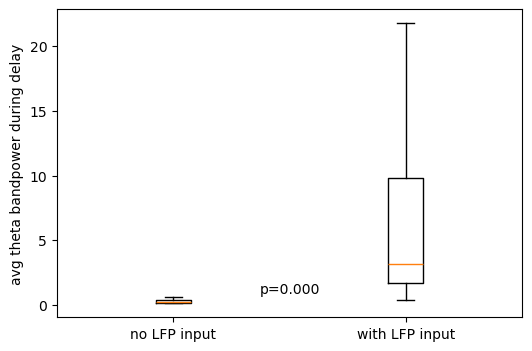

In [25]:
# for abstract — choose 20 for each

np.random.seed(12)
i_models = np.random.choice(len(delay_bandpower['xlfp']), 20, replace=False)
print(i_models)

plt.figure(figsize=(6,4))
plt.boxplot([np.mean(delay_bandpower['xlfp'][i_models,:], axis=1), 
             np.mean(delay_bandpower['lfp'][i_models,:], axis=1)], 
            positions=[1, 2]) # mean across trials
plt.xticks([1, 2], ['no LFP input', 'with LFP input'])
plt.ylabel('avg theta bandpower during delay')
# plt.title('jitter models trained with/without LFP input (delay=400, testing task)')
from scipy.stats import mannwhitneyu
stat, p = mannwhitneyu(np.mean(delay_bandpower['xlfp'][:20,:], axis=1), 
                       np.mean(delay_bandpower['lfp'][:20,:], axis=1))
print('Mann-Whitney U test: stat=%.3f, p=%.3f' % (stat, p))
plt.text(1.5, 0.9, 'p=%.3f' % p, ha='center')

# save as eps
plt.savefig('model_20_delay_theta_comparison_delay400.eps', format='eps', dpi=1000)

plt.show()


[19, 7, 18, 1, 15, 8, 4, 14, 22, 0, 10, 23, 24, 21, 9, 13, 5, 16, 12, 20]
Mann-Whitney U test: stat=4.000, p=0.000


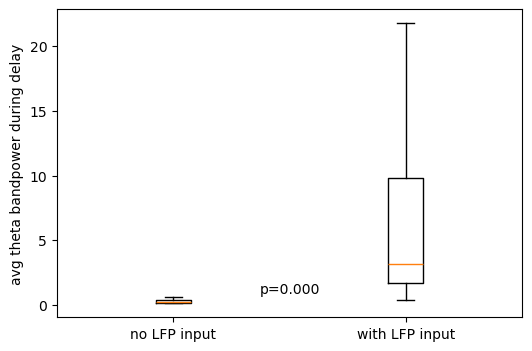

In [6]:
# for abstract — choose 20 for each

i_models = [19,  7, 18,  1, 15,  8,  4, 14, 22,  0, 10, 23, 24, 21,  9, 13,  5, 16, 12, 20]
print(i_models)

plt.figure(figsize=(6,4))
plt.boxplot([np.mean(delay_bandpower['xlfp'][i_models,:], axis=1), 
             np.mean(delay_bandpower['lfp'][i_models,:], axis=1)], 
            positions=[1, 2]) # mean across trials
plt.xticks([1, 2], ['no LFP input', 'with LFP input'])
plt.ylabel('avg theta bandpower during delay')
# plt.title('jitter models trained with/without LFP input (delay=400, testing task)')
from scipy.stats import mannwhitneyu
stat, p = mannwhitneyu(np.mean(delay_bandpower['xlfp'][i_models,:], axis=1), 
                       np.mean(delay_bandpower['lfp'][i_models,:], axis=1))
print('Mann-Whitney U test: stat=%.3f, p=%.3f' % (stat, p))
plt.text(1.5, 0.9, 'p=%.3f' % p, ha='center')

# save as eps
# plt.savefig('model_20_delay_theta_comparison_delay400.eps', format='eps', dpi=1000)

plt.show()


### for LFP inputs only to exc or inh populations

Processing model type: lfp, number of models: 31


/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/home/nuttidalab/miniconda3/envs/rnn_test/lib

Processing model type: lfp, number of models: 31


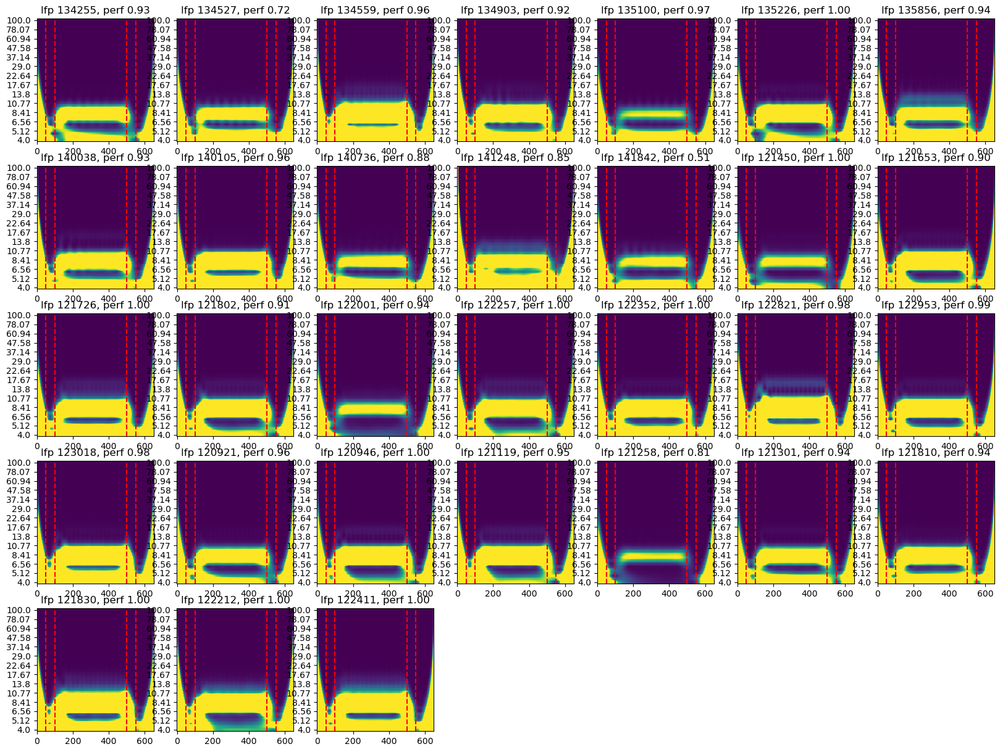

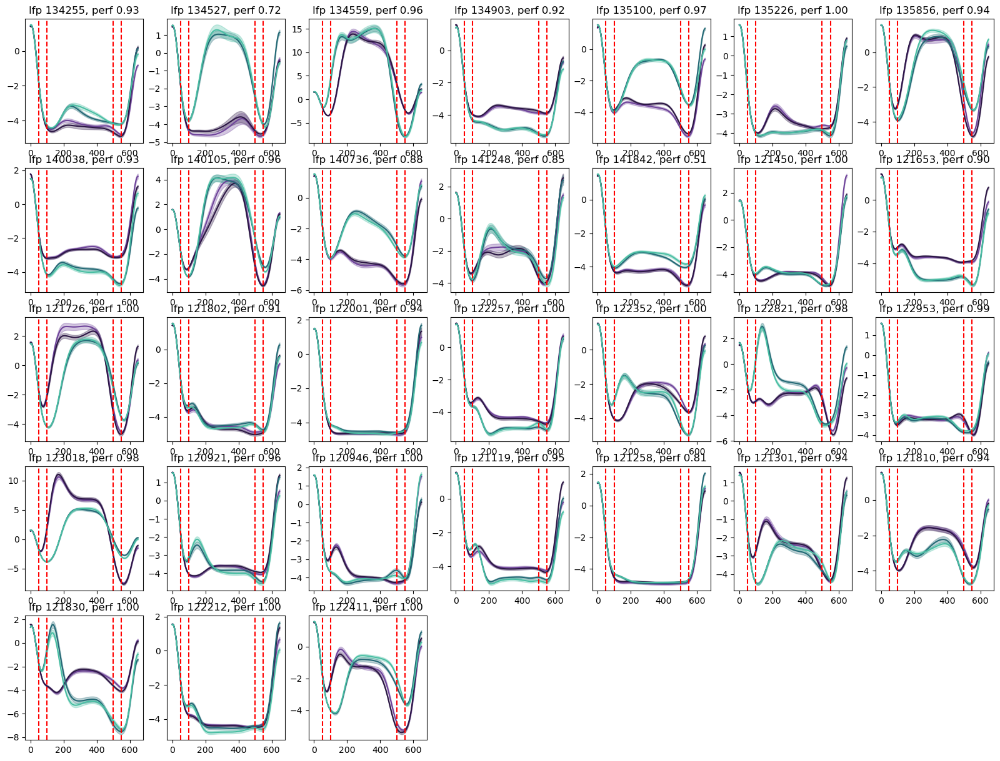

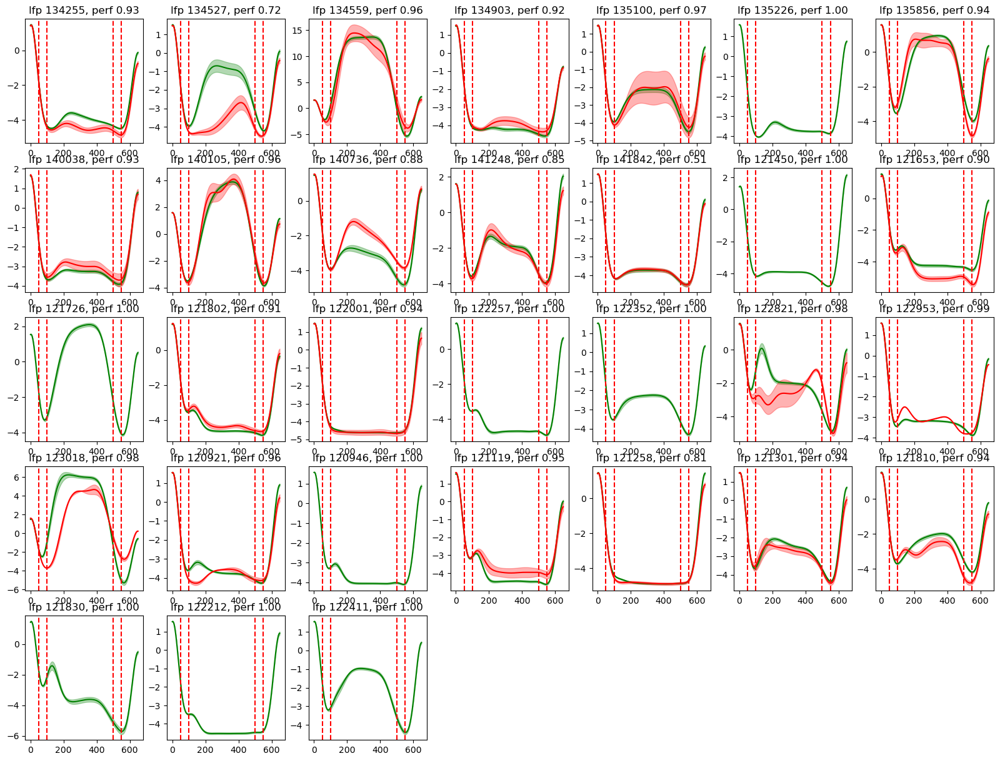

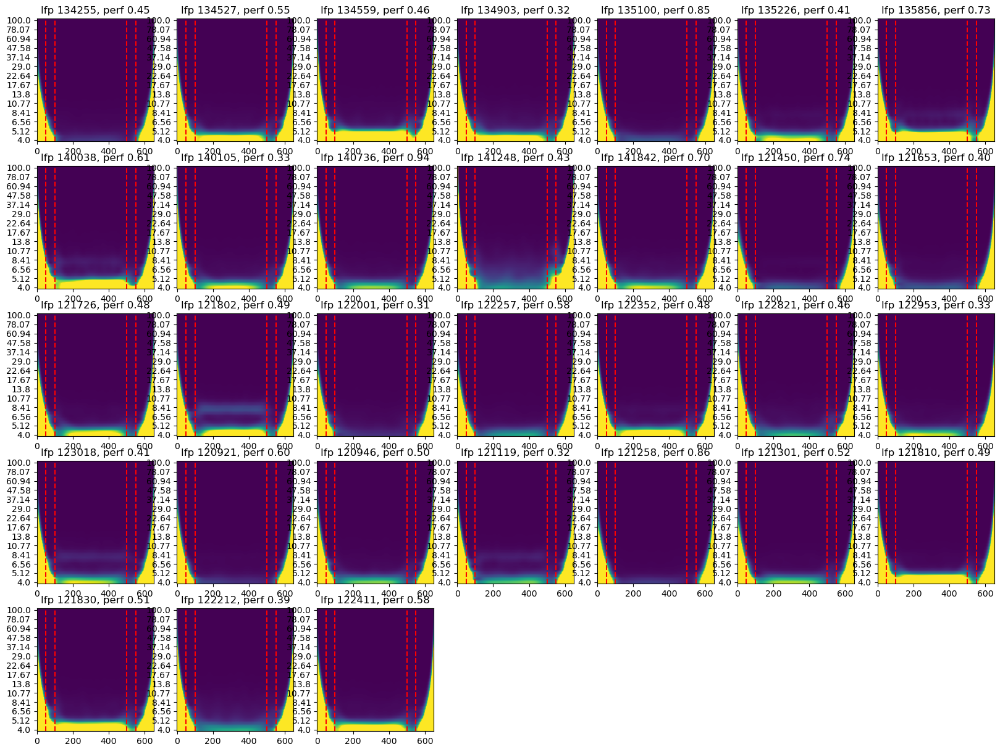

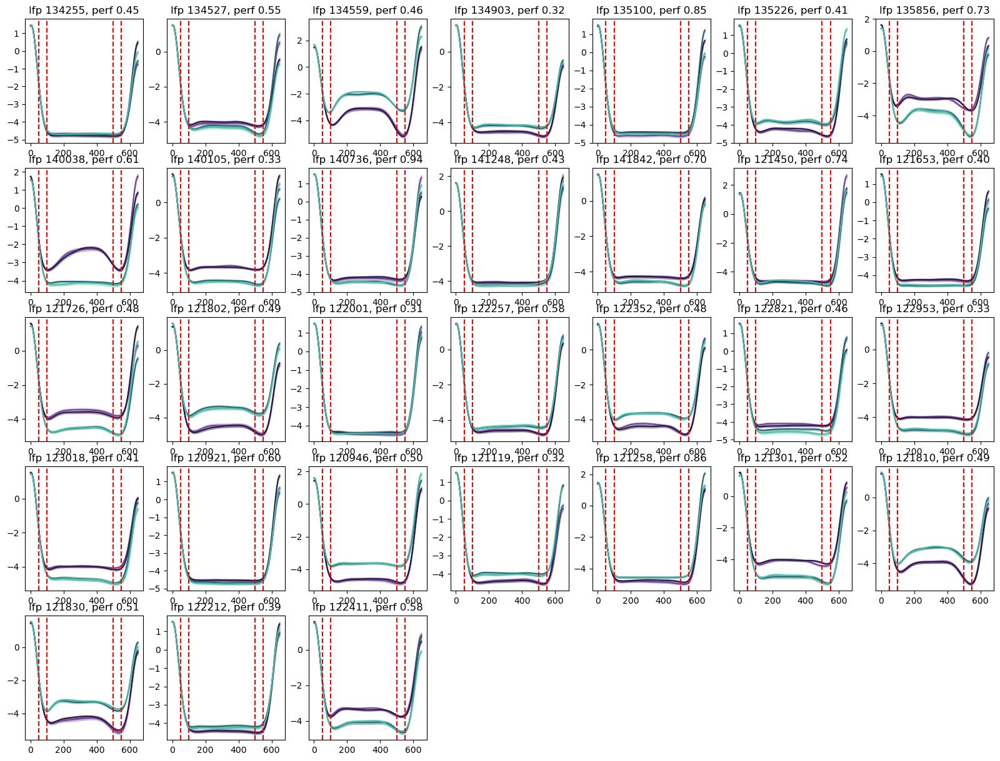

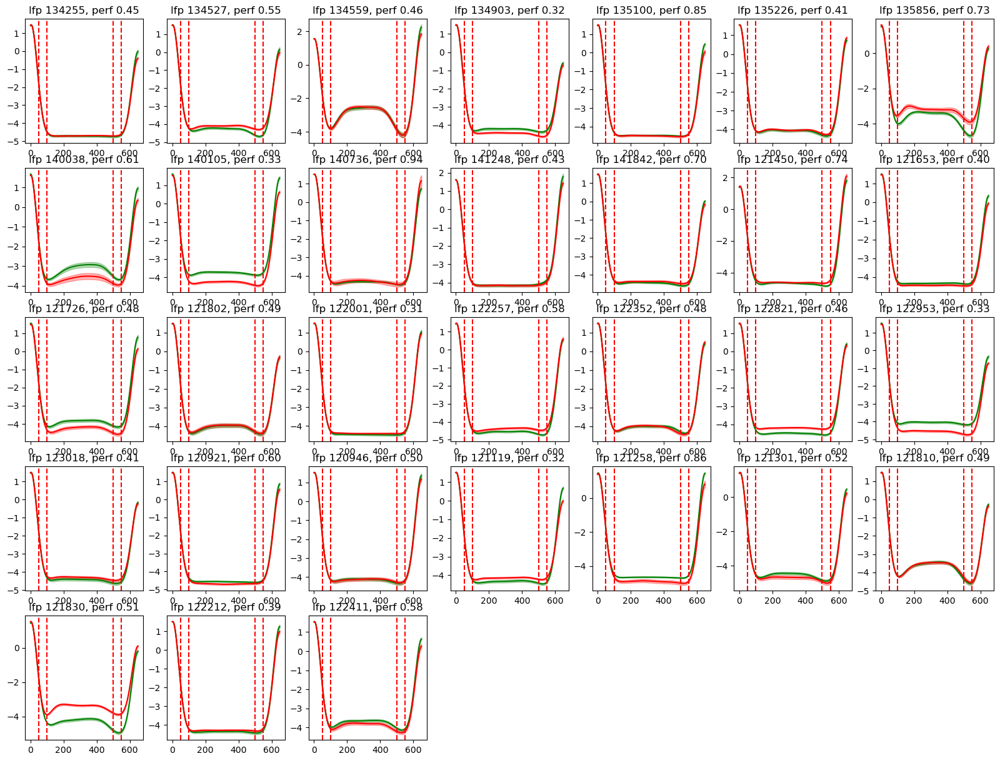

In [6]:
# make plots: spect, bandpower by trial type, bandpower by correct/incorrect -- z-scoring at bandpower step

importlib.reload(lu)

model_list = lfp_model_list #, lfp_alpha_model_list]
model_dir = lfp_model_dir #, lfp_model_dir]
model_list_name = 'lfp' #, 'lfp_alpha']
model_power = 4
condns = ['delay400_lfp_exc0', 'delay400_lfp_inh0']

for condn in condns:
    
    settings['lfp_power_target'] = [model_power]

    print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')
    
    # create figure
    fig1 = plt.figure(figsize=(20, 15)) # spectrogram
    fig2 = plt.figure(figsize=(20, 15)) # band power, split by trial type
    fig3 = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

    for model_name in model_list:
        # print(f"\nModel: {model_name}")
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn}.pkl'), 'rb'))
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]
        
        trial_power, freqs, phase = lu.compute_lfp_power(neural_dict['epsp'], settings['fs'], freq_range = [4, 100], num_freqs = n_freqs, n_cycles=7)
        trial_powerband = lu.compute_bandpower(trial_power, freqs, settings, band=[model_power], zscore=True, baseline=[10, 50])

        # first plot spectrogram
        ax1 = fig1.add_subplot(5, 7, model_list.index(model_name)+1)
        ax1.imshow(np.mean(trial_power, axis=0), aspect='auto', origin='lower',
               vmin=0, vmax=1.2)
        ax1.set_yticks(np.arange(0, 40, 3), np.round(freqs[::3], 2))
        # ax1.colorbar(label='Power')
        ax1.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax1.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
        
        # then plot band power, split by trial type
        ax2 = fig2.add_subplot(5,7, model_list.index(model_name)+1)
        stims, colors = ld.get_trialtype_colors()
        trial_types, trial_idxs = np.unique(np.array(bhv_dict['trial_type']), axis=0, return_inverse=True)
        for i, trial_type in enumerate(trial_types):
            trials_idx = (trial_idxs == i)
            powerband_mean = np.mean(trial_powerband[trials_idx, :], axis=0)
            powerband_sem = np.std(trial_powerband[trials_idx, :], axis=0) / np.sqrt(np.sum(trials_idx))
            ax2.plot(powerband_mean, color=colors[i])#, label=stims[i])
            ax2.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color=colors[i], alpha=0.3)
        ax2.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax2.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
        
        # finally plot band power, split by correct/incorrect
        ax3 = fig3.add_subplot(5, 7, model_list.index(model_name)+1)
        correct_trials = (np.array(bhv_dict['perf']) == 1)
        incorrect_trials = (np.array(bhv_dict['perf']) == 0)
        powerband_mean = np.mean(trial_powerband[correct_trials, :], axis=0)
        powerband_sem = np.std(trial_powerband[correct_trials, :], axis=0) / np.sqrt(np.sum(correct_trials))
        ax3.plot(powerband_mean, color='g', label='correct')
        ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='g', alpha=0.3)
        powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
        powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
        ax3.plot(powerband_mean, color='r', label='incorrect')
        ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='r', alpha=0.3)
        ax3.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax3.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')



In [16]:
# get avg bandpower during delay

importlib.reload(lu)

model_list = lfp_model_list #, lfp_alpha_model_list]
model_dir = lfp_model_dir
model_list_names = ['all', 'exc0', 'inh0'] #, 'lfp_alpha']
model_power = 4
condns = ['delay400','delay400_lfp_exc0', 'delay400_lfp_inh0']

delay_bandpower = {'all': [], 'exc0': [], 'inh0': [] }

for i, condn in enumerate(condns):
    settings['lfp_power_target'] = [model_power]

    print(f'Processing model type: {model_list_names[i]}, number of models: {len(model_list)}')

    for model_name in model_list:
        # print(f"\nModel: {model_name}")
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn}.pkl'), 'rb'))
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]
        
        trial_power, freqs, phase = lu.compute_lfp_power(neural_dict['epsp'], settings['fs'], freq_range = [4, 100], num_freqs = n_freqs, n_cycles=7)
        trial_powerband = lu.compute_bandpower(trial_power, freqs, settings, band=[model_power], zscore=False, baseline=[10, 50])

        delay_idx = np.arange(settings['stim_on']+settings['stim_dur'], settings['stim_on']+settings['stim_dur']+settings['delay'])
        avg_delay_power = np.mean(trial_powerband[:, delay_idx], axis=1)
        delay_bandpower[model_list_names[i]].append(avg_delay_power)
    delay_bandpower[model_list_names[i]] = np.array(delay_bandpower[model_list_names[i]])
    print(f'{model_list_names[i]} avg delay bandpower shape: {delay_bandpower[model_list_names[i]].shape}')
        

Processing model type: all, number of models: 31
all avg delay bandpower shape: (31, 100)
Processing model type: exc0, number of models: 31
exc0 avg delay bandpower shape: (31, 100)
Processing model type: inh0, number of models: 31
inh0 avg delay bandpower shape: (31, 100)


Mann-Whitney U test: stat=415.000, p=0.360
Mann-Whitney U test: stat=797.000, p=0.000
Mann-Whitney U test: stat=823.000, p=0.000


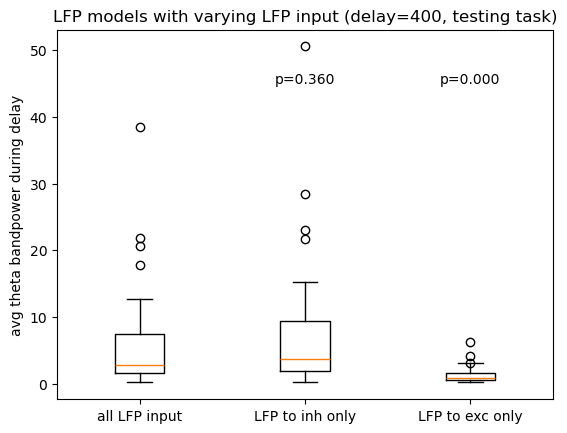

In [18]:
plt.figure()
plt.boxplot([np.mean(delay_bandpower['all'], axis=1),
             np.mean(delay_bandpower['exc0'], axis=1), 
             np.mean(delay_bandpower['inh0'], axis=1)], 
            positions=[1, 2, 3]) # mean across trials
plt.xticks([1, 2, 3], ['all LFP input', 'LFP to inh only', 'LFP to exc only'])
plt.ylabel('avg theta bandpower during delay')
plt.title('LFP models with varying LFP input (delay=400, testing task)')
from scipy.stats import mannwhitneyu
stat, p = mannwhitneyu(np.mean(delay_bandpower['all'], axis=1), 
                       np.mean(delay_bandpower['exc0'], axis=1))
print('Mann-Whitney U test: stat=%.3f, p=%.3f' % (stat, p))
plt.text(2, 45, 'p=%.3f' % p, ha='center')
stat, p = mannwhitneyu(np.mean(delay_bandpower['all'], axis=1), 
                       np.mean(delay_bandpower['inh0'], axis=1))
print('Mann-Whitney U test: stat=%.3f, p=%.3f' % (stat, p))
plt.text(3, 45, 'p=%.3f' % p, ha='center')
stat, p = mannwhitneyu(np.mean(delay_bandpower['exc0'], axis=1), 
                       np.mean(delay_bandpower['inh0'], axis=1))
print('Mann-Whitney U test: stat=%.3f, p=%.3f' % (stat, p))
# plt.text(2, 0.7, 'p=%.3f' % p, ha='center')
plt.show()


[19, 7, 18, 1, 15, 8, 4, 14, 22, 0, 10, 23, 24, 21, 9, 13, 5, 16, 12, 20]
Mann-Whitney U test: stat=188.000, p=0.756
Mann-Whitney U test: stat=365.000, p=0.000
Mann-Whitney U test: stat=369.000, p=0.000


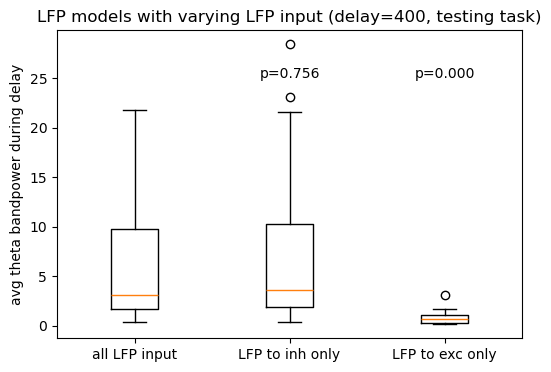

In [21]:
# for abstract — choose 20 for each

i_models = [19,  7, 18,  1, 15,  8,  4, 14, 22,  0, 10, 23, 24, 21,  9, 13,  5, 16, 12, 20]
print(i_models)

plt.figure(figsize=(6,4))
plt.boxplot([np.mean(delay_bandpower['all'][i_models,:], axis=1), 
             np.mean(delay_bandpower['exc0'][i_models,:], axis=1),
             np.mean(delay_bandpower['inh0'][i_models,:], axis=1)],
            positions=[1, 2, 3]) # mean across trials
plt.xticks([1, 2, 3], ['all LFP input', 'LFP to inh only', 'LFP to exc only'])
plt.ylabel('avg theta bandpower during delay')
plt.title('LFP models with varying LFP input (delay=400, testing task)')
from scipy.stats import mannwhitneyu
stat, p = mannwhitneyu(np.mean(delay_bandpower['all'][i_models,:], axis=1), 
                       np.mean(delay_bandpower['exc0'][i_models,:], axis=1))
print('Mann-Whitney U test: stat=%.3f, p=%.3f' % (stat, p))
plt.text(2, 25, 'p=%.3f' % p, ha='center')
stat, p = mannwhitneyu(np.mean(delay_bandpower['all'][i_models,:], axis=1), 
                       np.mean(delay_bandpower['inh0'][i_models,:], axis=1))
print('Mann-Whitney U test: stat=%.3f, p=%.3f' % (stat, p))
plt.text(3, 25, 'p=%.3f' % p, ha='center')
stat, p = mannwhitneyu(np.mean(delay_bandpower['exc0'][i_models], axis=1), 
                       np.mean(delay_bandpower['inh0'][i_models], axis=1))
print('Mann-Whitney U test: stat=%.3f, p=%.3f' % (stat, p))
# plt.text(2, 0.7, 'p=%.3f' % p, ha='center')
plt.show()
